## Self-Organising Maps (SOM)
Author: Adrien Loiseau

In [25]:
# Run the help_functions.py script to have acces to the imports and helper functions
%run help_functions.py

import networkx as nx
from matplotlib.gridspec import GridSpec
np.random.seed(42)

### Load the data

In [2]:
file_name = "Data/ERA5_geopotential_500hPa_1940_2025_winter_midnight_Euro_Atlantic.nc"
dataset_dict = load_dataset(file_name=file_name)

Geopotential height dataset (0.25°x0.25°): (nb_days=7731, nb_lats=241, nb_longs=561, grid_size=135201)
Geopotential height dataset (0.50°x0.50°): (nb_days=7731, nb_lats=121, nb_longs=281, grid_size=34001)
Geopotential height data: (7731, 121, 281)
Reshaped geopotential height data: (7731, 34001)
Geopotential height anomalies: (7731, 121, 281)
Reshaped geopotential height anomalies: (7731, 34001)
Daily winter data from 1940 to 2025 successfully loaded. Loading time: 49.40 seconds.


### SOM grid topology

In [ ]:
def SOM_grid_topology(SOM_nrows, SOM_ncols, show_grid=True):
    """
    Create a Self-Organizing Map (SOM) grid topology using NetworkX.

    Parameters:
    -----------
    - SOM_nrows: Number of rows in the SOM grid.
    - SOM_ncols: Number of columns in the SOM grid.

    Returns:
    --------
    - G: A NetworkX graph representing the SOM grid topology.
    """
    G = nx.Graph()

    ### Add nodes ###
    for node in range(SOM_nrows * SOM_ncols):
        G.add_node(node)

    ### Add edges ###
    for row in range(SOM_nrows):
        for col in range(SOM_ncols):
            ### Add edge to the right ###
            if col < SOM_ncols - 1:
                G.add_edge(row * SOM_ncols + col, row * SOM_ncols + col + 1)
            ### Add edge down ###
            if row < SOM_nrows - 1:
                G.add_edge(row * SOM_ncols + col, (row + 1) * SOM_ncols + col)
            ### Add edge ro the upper right diagonal ###
            if row > 0 and col < SOM_ncols - 1:
                G.add_edge(row * SOM_ncols + col, (row - 1) * SOM_ncols + col + 1)
            ### Add edge to the lower right diagonal ###
            if row < SOM_nrows - 1 and col < SOM_ncols - 1:
                G.add_edge(row * SOM_ncols + col, (row + 1) * SOM_ncols + col + 1)

    ### Plot the graph ###
    if (show_grid == True):
        for node in G.nodes():
            row = node // SOM_ncols ; col = node % SOM_ncols
            G.nodes[node]['pos'] = (col, -row) # Invert y-axis for better visualization, so that node (0,0) is at the top left corner
            
        pos = nx.get_node_attributes(G, 'pos') # ; print(pos)
        fig = plt.figure(figsize=(5, 5))
        nx.draw(G=G, pos=pos, node_size=500, node_color='lightblue', font_size=15, font_color='black', labels={node: f"{node+1}" for node in G.nodes()})
        # plt.savefig(f"Images/SOM_grid_{SOM_nrows}x{SOM_ncols}.png", dpi=300, bbox_inches='tight')
        plt.show()

    return G

In [177]:
SOM_nrows = 9 ; SOM_ncols = 9

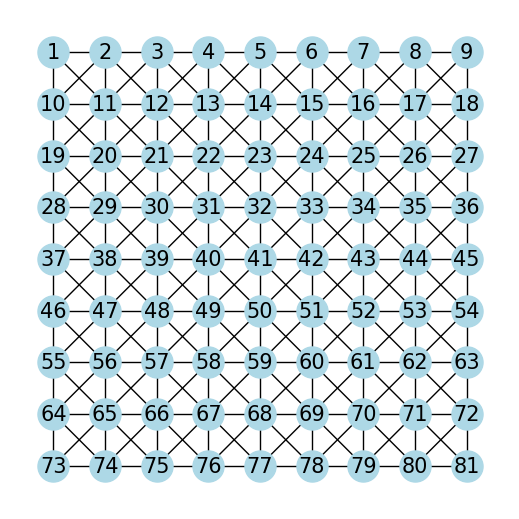

In [270]:
G_rect = SOM_grid_topology(SOM_nrows=SOM_nrows, SOM_ncols=SOM_ncols, show_grid=True)

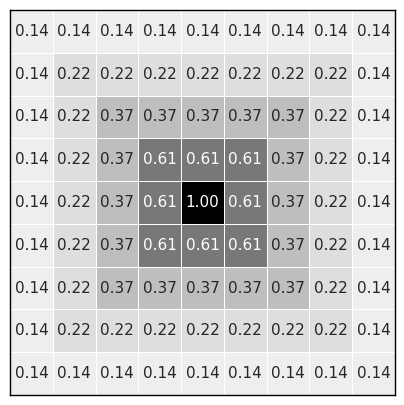

In [291]:
width_neighborhood_fct = 1 ; G = G_rect # G_rect or G_hexa
array = np.zeros((SOM_nrows, SOM_ncols)) ; winning_cluster = 40
for node in G.nodes():
    grid_distance = nx.shortest_path_length(G=G, source=winning_cluster, target=node)
    distance_fct = np.exp(- grid_distance / (2 * width_neighborhood_fct**2)) # Gaussian function
    array[node // SOM_ncols, node % SOM_ncols] = distance_fct

plt.figure(figsize=(5, 5))
ax = sns.heatmap(array, annot=True, fmt='.2f', cmap='Greys', linecolor="white", cbar=False, linewidth=0.5, annot_kws={"size":11}, vmin=0, vmax=1, square=True, xticklabels=False, yticklabels=False)
### Add a border around the heatmap ###
for spine in ax.spines.values():
    spine.set_visible(True)
    spine.set_linewidth(1)
    spine.set_color('black')
ax = plt.gca() ; ax.tick_params(labelsize=13)
# plt.savefig(f"Images/SOM_neighborhood_function_{SOM_nrows}x{SOM_ncols}.png", dpi=300, bbox_inches='tight')
plt.show()

### SOM Training Algorithm

In [195]:
def SOM_training(G, SOM_nrows, SOM_ncols, nb_iterations, learning_rate_0, width_neighborhood_fct_0):
    nb_samples = geopotential_height_anomalies_reshaped.shape[0]
    nb_features = geopotential_height_anomalies_reshaped.shape[1]
    # print(f"geopotential_height_anomalies_reshaped.shape={geopotential_height_anomalies_reshaped.shape}")

    SOM_nb_clusters = SOM_nrows * SOM_ncols
    weights = np.random.rand(SOM_nrows, SOM_ncols, nb_features) # ; print(f"Shape of the weights: {weights.shape}")

    learning_rate = learning_rate_0
    width_neighborhood_fct = width_neighborhood_fct_0

    training_errors = np.zeros(nb_iterations)

    print(f"Training SOM with {SOM_nb_clusters} clusters ({SOM_nrows}x{SOM_ncols} grid)")
    print(f"SOM parameters: nb_samples={nb_samples}, nb_features={nb_features}, learning_rate_0={learning_rate_0}, width_neighborhood_fct_0={width_neighborhood_fct_0}, nb_iterations={nb_iterations}")

    start_total_time = time.time()
    for iteration in range(nb_iterations):
        start_time = time.time()
        np.random.shuffle(geopotential_height_anomalies_reshaped)
        for sample_idx in range(nb_samples):
            ### Find the vectorial location of the BMU of the sample ###
            sample = geopotential_height_anomalies_reshaped[sample_idx, :] # ; print(f"Shape of the sample: {sample.shape}")
            
            ### Compute the distance between the sample and the weights ###
            distances = np.linalg.norm(sample.reshape(1, -1) - weights.reshape(SOM_nb_clusters, -1), axis=1) # ; print(f"Shape of the distances: {distances.shape}")

            ### Select the cluster with the smallest distance as the winning cluster ###
            winning_cluster_idx = np.argmin(distances) # ; print(winning_cluster_idx)
            winning_cluster_row = winning_cluster_idx // SOM_ncols ; winning_cluster_col = winning_cluster_idx % SOM_ncols # ; print(f"Winning cluster row: {winning_cluster_row}, col: {winning_cluster_col}")

            ### Update the weights of the SOM cells in the neighborhood of the winning cluster ###
            for row in range(SOM_nrows):
                for col in range(SOM_ncols):
                    ### Compute the distance between the current cell and the winning cluster ###
                    # grid_distance = np.sqrt((row - winning_cluster_row)**2 + (col - winning_cluster_col)**2)
                    grid_distance = nx.shortest_path_length(G=G, source=winning_cluster_idx, target=row * SOM_ncols + col) # Get the shortest path length in the grid

                    ### Update the weights of the current cell if it is in the neighborhood of the winning cluster ###
                    distance_fct = np.exp(- grid_distance / (2 * width_neighborhood_fct**2)) # Gaussian function
                    weights[row, col, :] += learning_rate * distance_fct * (sample - weights[row, col, :])

        end_time = time.time()
        print(f"Iteration {iteration} time: {end_time - start_time:.2f} seconds")

        ### Update learning rate and radius ###
        learning_rate = learning_rate_0 * (1 / (iteration+1)) # Linear decay
        # learning_rate = learning_rate_0 * np.exp(- iteration * 0.1) # Exponential decay
        width_neighborhood_fct = width_neighborhood_fct_0 * np.exp(- iteration * 0.1) # Exponential decay

        ### Compute the error made at iteration i ###
        for sample_idx in range(nb_samples):
            sample = geopotential_height_anomalies_reshaped[sample_idx, :]
        
            ### Compute the distance between the sample and the weights ###
            distances = np.linalg.norm(sample.reshape(1, -1) - weights.reshape(SOM_nb_clusters, -1), axis=1)
            
            training_errors[iteration] += np.min(distances) # Distance to the BMU

    end_total_time = time.time() ; print(f"Total time: {end_total_time - start_total_time:.2f} seconds")

    return weights, training_errors

In [196]:
geopotential_height_anomalies_reshaped = dataset_dict['geopotential_height_anomalies_reshaped']
print(geopotential_height_anomalies_reshaped.shape)

(7731, 34001)


In [197]:
### Reduce the spatial resolution of the data ###
# step = 1 # 0.5x0.5 degrees
# step = 2 # 1.0x1.0 degrees
# step = 5 # 1.5x1.5 degrees
# step = 4 # 2.0x2.0 degrees
step = 5 # 2.5x2.5 degrees
# step = 10 # 5x5 degrees
new_geopotential_height_anomalies_reshaped = []
nb_lats = len(dataset_dict["lats"]) ; nb_longs = len(dataset_dict["longs"])
geopotential_height_anomalies_reshaped = dataset_dict["geopotential_height_anomalies_reshaped"].reshape(-1, nb_lats, nb_longs)
for day in range(len(geopotential_height_anomalies_reshaped)):
    new_geopotential_height_anomalies_reshaped.append([])
    for row in range(0, len(geopotential_height_anomalies_reshaped[day]), step):
        new_geopotential_height_anomalies_reshaped[day].append(geopotential_height_anomalies_reshaped[day][row][::step])

lats = dataset_dict["lats"][::step] ; longs = dataset_dict["longs"][::step] ; nb_lats = len(lats) ; nb_longs = len(longs)
# print(lats[:5], longs[:5]) ; print(nb_lats * nb_longs)

geopotential_height_anomalies_reshaped = np.array(new_geopotential_height_anomalies_reshaped).reshape(-1, nb_lats*nb_longs)
print(geopotential_height_anomalies_reshaped.shape)

(7731, 1425)


In [11]:
# Training SOM with 25 clusters (5x5 grid) # 0.5x0.5 degrees
# SOM parameters: nb_samples=7731, nb_features=34001, learning_rate_0=0.1, width_neighborhood_fct_0=2, nb_iterations=1
# Iteration 0 time: 65.19 seconds
# Total time: 110.94 seconds

# Training SOM with 25 clusters (5x5 grid) # 1.0x1.0 degrees
# SOM parameters: nb_samples=7731, nb_features=8601, learning_rate_0=0.1, width_neighborhood_fct_0=2, nb_iterations=1
# Iteration 0 time: 21.26 seconds
# Total time: 32.29 seconds

# Training SOM with 25 clusters (5x5 grid) # 1.5x1.5 degrees
# SOM parameters: nb_samples=7731, nb_features=3854, learning_rate_0=0.1, width_neighborhood_fct_0=2, nb_iterations=1
# Iteration 0 time: 8.97 seconds
# Total time: 10.26 seconds

# Training SOM with 25 clusters (5x5 grid) # 2.0x2.0 degrees
# SOM parameters: nb_samples=7731, nb_features=2201, learning_rate_0=0.1, width_neighborhood_fct_0=2, nb_iterations=1
# Iteration 0 time: 7.41 seconds
# Total time: 8.23 seconds

# Training SOM with 25 clusters (5x5 grid) # 2.5x2.5 degrees
# SOM parameters: nb_samples=7731, nb_features=1425, learning_rate_0=0.1, width_neighborhood_fct_0=2, nb_iterations=1
# Iteration 0 time: 6.94 seconds
# Total time: 7.71 seconds

In [198]:
nb_iterations = 15 ; SOM_nb_clusters = SOM_nrows * SOM_ncols
weights, training_errors = SOM_training(G=G_rect, SOM_nrows=SOM_nrows, SOM_ncols=SOM_ncols, nb_iterations=nb_iterations, learning_rate_0=0.1, width_neighborhood_fct_0=1)

Training SOM with 81 clusters (9x9 grid)
SOM parameters: nb_samples=7731, nb_features=1425, learning_rate_0=0.1, width_neighborhood_fct_0=1, nb_iterations=15
Iteration 0 time: 20.08 seconds
Iteration 1 time: 21.55 seconds
Iteration 2 time: 21.19 seconds
Iteration 3 time: 25.25 seconds
Iteration 4 time: 23.08 seconds
Iteration 5 time: 22.46 seconds
Iteration 6 time: 22.20 seconds
Iteration 7 time: 22.25 seconds
Iteration 8 time: 21.94 seconds
Iteration 9 time: 22.30 seconds
Iteration 10 time: 22.09 seconds
Iteration 11 time: 21.89 seconds
Iteration 12 time: 20.91 seconds
Iteration 13 time: 21.89 seconds
Iteration 14 time: 21.32 seconds
Total time: 357.09 seconds


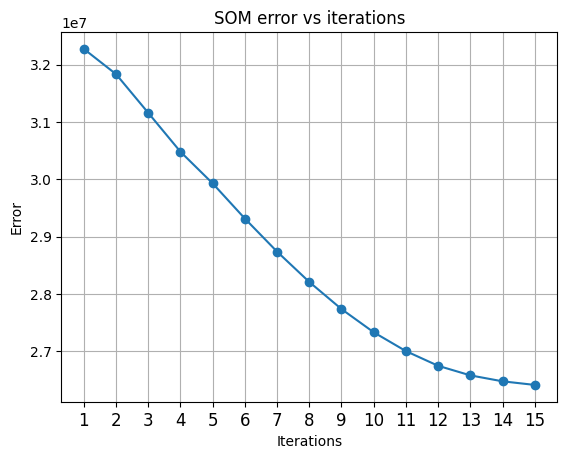

[440023.29763958 674335.36823921 677877.0887453  551972.33968549
 613155.87494655 576543.64436565 528262.95446485 472820.91944019
 404415.30052799 328341.3174121  256098.08237057 166816.41637251
 103760.75305941  62833.66742534]


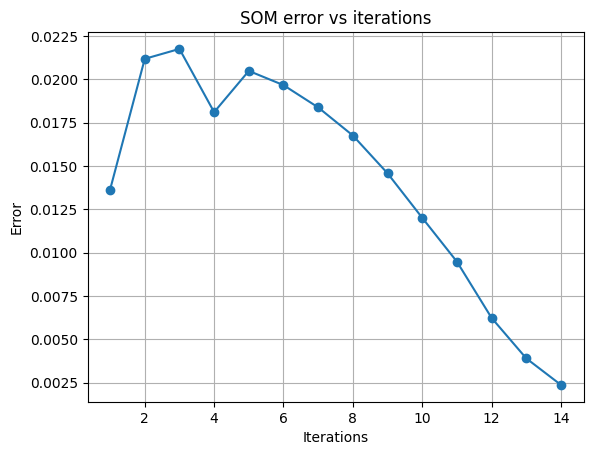

In [199]:
nb_iterations = len(training_errors)
plt.plot(np.arange(nb_iterations)+1, training_errors, '-o') ; plt.grid() ; plt.title("SOM error vs iterations")
ax = plt.gca() ; ax.set_xticks(np.arange(nb_iterations)+1) ; ax.set_xticklabels(np.arange(nb_iterations)+1, fontsize=12)
plt.xlabel("Iterations") ; plt.ylabel("Error") ; plt.show()
print(training_errors[:-1] - training_errors[1:])
plt.plot(np.arange(nb_iterations-1)+1, (training_errors[:-1] - training_errors[1:]) / training_errors[:-1], '-o') ; plt.title("SOM error vs iterations") 
plt.xlabel("Iterations") ; plt.ylabel("Error") ; plt.grid() ; plt.show()

### Compute the SOM labels and errors ###

In [148]:
print(nx.adjacency_matrix(G_rect).todense()) # Adjacency matrix of the grid

[[0 1 0 ... 0 0 0]
 [1 0 1 ... 0 0 0]
 [0 1 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 1 0]
 [0 0 0 ... 1 0 1]
 [0 0 0 ... 0 1 0]]


In [200]:
nb_samples = geopotential_height_anomalies_reshaped.shape[0]
SOM_labels = np.zeros(nb_samples, dtype=int)
assignment_array = np.zeros((SOM_nrows, SOM_ncols))

for sample_idx in range(nb_samples):
    sample = geopotential_height_anomalies_reshaped[sample_idx, :]
    
    ### Compute the distance between the sample and the weights ###
    distances = np.linalg.norm(sample.reshape(1, -1) - weights.reshape(SOM_nb_clusters, -1), axis=1)
    
    ### Select the cluster with the smallest distance as the winning cluster ###
    winning_cluster_idx = np.argmin(distances)
    winning_cluster_row = winning_cluster_idx // SOM_ncols ; winning_cluster_col = winning_cluster_idx % SOM_ncols
    assignment_array[winning_cluster_row, winning_cluster_col] += 1
    
    SOM_labels[sample_idx] = winning_cluster_idx

# print(np.unique(SOM_labels, return_counts=True))


### Compute the errors made by the each SOM node ###
errors = np.zeros((SOM_nrows, SOM_ncols))
for sample_idx in range(nb_samples):
    sample = geopotential_height_anomalies_reshaped[sample_idx, :]
    winning_cluster_idx = int(SOM_labels[sample_idx])
    winning_cluster_row = winning_cluster_idx // SOM_ncols ; winning_cluster_col = winning_cluster_idx % SOM_ncols
    errors[winning_cluster_row, winning_cluster_col] += np.linalg.norm(sample - weights[winning_cluster_row, winning_cluster_col, :])

# adjacency_matrix = np.zeros((SOM_nb_clusters, SOM_nb_clusters), dtype=int)
# for row in range(SOM_nrows):
#     for col in range(SOM_ncols):
#         for row2 in range(max(0, row-1), min(SOM_nrows, row+2)):
#             for col2 in range(max(0, col-1), min(SOM_ncols, col+2)):
#                 if (abs(row - row2) + abs(col - col2)) == 1:
#                     adjacency_matrix[row * SOM_ncols + col, row2 * SOM_ncols + col2] = 1

adjacency_matrix = nx.adjacency_matrix(G_rect).todense()

### Check if the first and second closest BMUs are adjacent ###
t_error = 0
for sample_idx in range(nb_samples):
    sample = geopotential_height_anomalies_reshaped[sample_idx, :]
    
    # Compute the distance between the sample and the weights
    distances = np.linalg.norm(sample.reshape(1, -1) - weights.reshape(SOM_nb_clusters, -1), axis=1)
    
    # Select the cluster with the smallest distance as the winning cluster
    winning_cluster_idx = np.argmin(distances) ; winning_cluster_row = winning_cluster_idx // SOM_ncols ; winning_cluster_col = winning_cluster_idx % SOM_ncols
    second_closest_bmu_idx = np.argsort(distances)[1] ; second_closest_bmu_row = second_closest_bmu_idx // SOM_ncols ; second_closest_bmu_col = second_closest_bmu_idx % SOM_ncols

    if (adjacency_matrix[winning_cluster_row * SOM_ncols + winning_cluster_col, second_closest_bmu_row * SOM_ncols + second_closest_bmu_col] != 1): t_error += 1
    # print(winning_cluster_row, winning_cluster_col, second_closest_bmu_row, second_closest_bmu_col, t_error)

print(f"t_error={100 - t_error / len(SOM_labels) * 100:.2f}% of the samples have adjacent first and second BMUs")

t_error=57.99% of the samples have adjacent first and second BMUs


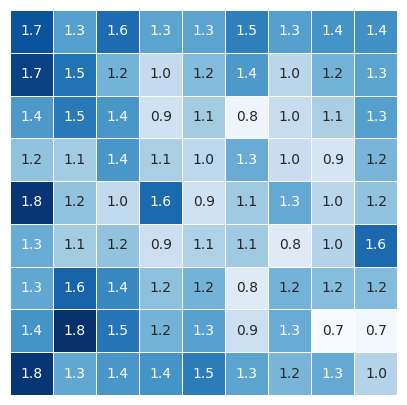

Total error: 277260.66
Average error: 3422.97


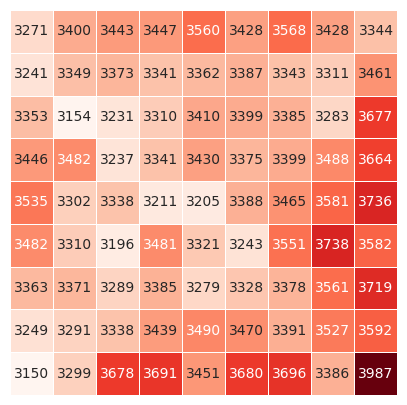

In [ ]:
### Plot the numbers of samples associated to each cluster ###
plt.figure(figsize=(5, 5)) ; assignment_array_perc = assignment_array / len(SOM_labels) * 100
sns.heatmap(assignment_array_perc, annot=True, cmap='Blues', cbar=False, fmt=".1f", linewidth=0.5, vmin=np.min(assignment_array_perc), vmax=np.max(assignment_array_perc), xticklabels=False, yticklabels=False)
# plt.title("Percentage of samples associated to each cluster")
# plt.savefig(f"Images/SOM_assignment_{SOM_nrows}x{SOM_ncols}.png", dpi=300, bbox_inches='tight')
plt.show()

#### Plot the error associated to each weight vector ###
plt.figure(figsize=(5, 5)) ; q_error = errors / assignment_array ; print(f"Total error: {np.sum(q_error):.2f}") ; print(f"Average error: {np.sum(q_error) / SOM_nb_clusters:.2f}")
sns.heatmap(q_error, annot=True, cmap='Reds', cbar=False, fmt=".0f", linewidth=0.5, vmin=np.min(q_error), vmax=np.max(q_error), xticklabels=False, yticklabels=False)
# plt.title(f"Error associated to each weight vector (avg={np.sum(q_error)/SOM_nb_clusters:.0f})")
# plt.savefig(f"Images/SOM_error_{SOM_nrows}x{SOM_ncols}.png", dpi=300, bbox_inches='tight')
plt.show()

### Perform Sammon mapping on the SOM weights ###

Sammon mapping performed in 0.35 seconds


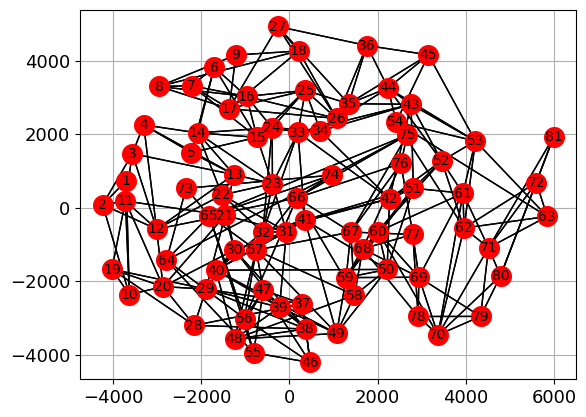

In [ ]:
%run sammon.py
start_time = time.time()
[y, E] = sammon(x=weights.reshape(SOM_nb_clusters, -1), n=2, tolfun=1e-5, display=0)
end_time = time.time() ; print(f"Sammon mapping performed in {end_time - start_time:.2f} seconds")

adjacency_matrix = nx.adjacency_matrix(G_rect).todense()
# adjacency_matrix = np.zeros((SOM_nrows * SOM_ncols, SOM_nrows * SOM_ncols))
# for node1 in G.nodes():
#     for node2 in G.nodes():
#         if (node1 != node2):
#             if (G.has_edge(node1, node2)):
#                 adjacency_matrix[node1, node2] = 1

# for row in range(SOM_nrows):
#     for col in range(SOM_ncols):
#         for row2 in range(max(0, row-1), min(SOM_nrows, row+2)):
#             for col2 in range(max(0, col-1), min(SOM_ncols, col+2)):
#                 if (G)
#                 if (abs(row - row2) + abs(col - col2)) == 1:
#                     adjacency_matrix[row * SOM_ncols + col, row2 * SOM_ncols + col2] = 1

# plt.figure(figsize=(6, 6))
# plt.imshow(adjacency_matrix, cmap='Blues')
# plt.xticks(np.arange(SOM_nrows*SOM_ncols+1)-.5, minor=True)
# plt.yticks(np.arange(SOM_nrows*SOM_ncols+1)-.5, minor=True)
# plt.grid(which="minor", color="grey", linestyle='-', linewidth=1)
# plt.show()

# Plot the Sammon map for the SOM
plt.scatter(y[:, 0], y[:, 1], s=200, c='r', marker='o', zorder=3)
for i in range(y.shape[0]):
    plt.text(y[i, 0], y[i, 1], str(i+1), fontsize=10, ha='center', va='center')
for row in range(adjacency_matrix.shape[0]):
    for col in range(adjacency_matrix.shape[1]):
        if (adjacency_matrix[row, col] == 1):
            plt.plot([y[row, 0], y[col, 0]], [y[row, 1], y[col, 1]], 'k-', lw=1)
plt.grid() ; ax = plt.gca() ; ax.tick_params(labelsize=13)
# plt.savefig(f"Images/SOM_Sammon_map_{SOM_nrows}x{SOM_ncols}.png", dpi=300, bbox_inches='tight')
plt.show()

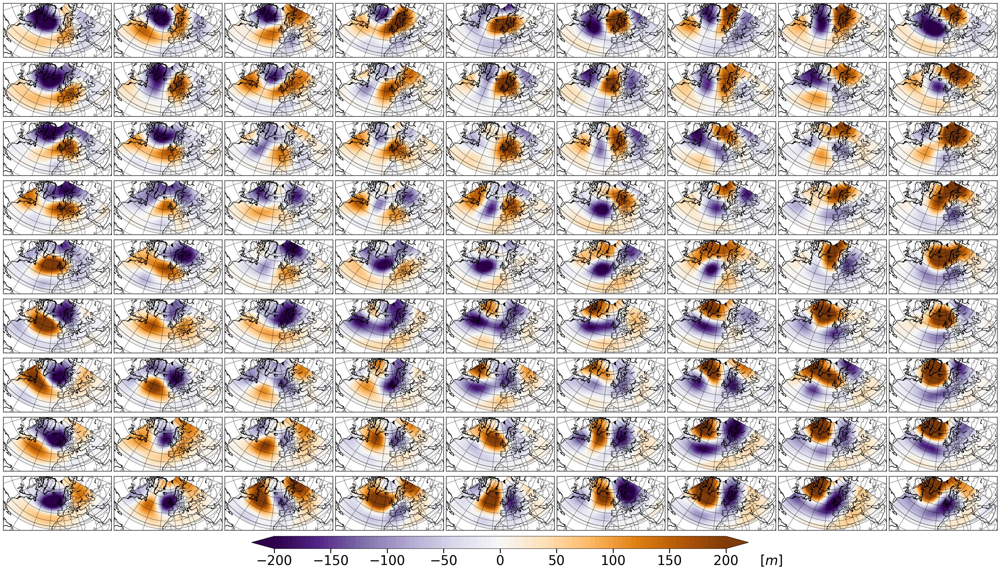

In [256]:
fig, axs = plt.subplots(nrows=SOM_nrows, ncols=SOM_ncols, figsize=(SOM_ncols*3.5, SOM_nrows*2), constrained_layout=True, sharex=True, sharey=True)
for idx in range(SOM_nb_clusters): # Loop over the SOM node indices (starting from 0 --> +1)
    row = idx // SOM_ncols ; col = idx % SOM_ncols ; axis_to_plot = axs[col] if (SOM_nrows == 1) else axs[row, col]
    m, contour, ticks = create_contour_data(ax=axis_to_plot, dataset_dict=dataset_dict, type_plot="geopotential_height_anomalies_temporal_mean",
                                            geopotential_height_data_to_plot=(weights[row, col, :].reshape(nb_lats, nb_longs)), lats=lats, longs=longs) # Reshape the 1-D array to a 2-D array

### Add a colorbar under the last row of subplots ###
cbar = fig.colorbar(contour, ax=axs, ticks=ticks, location='bottom', extend='both', shrink=0.5, pad=0.01, aspect=40)
cbar.ax.tick_params(labelsize=30, length=10, width=2) # Set the font size of the colorbar ticks
cbar.ax.text(x=1.1, y=-1, s=r'$[m]$', transform=cbar.ax.transAxes, ha='center', va='center', fontsize=30) # The coordinate system of the Axes: (0, 0) is bottom left, and (1, 1) is top right.
plt.savefig(f"Images/SOM_patterns_{SOM_nrows}x{SOM_ncols}.png", dpi=300, bbox_inches='tight')
plt.show()

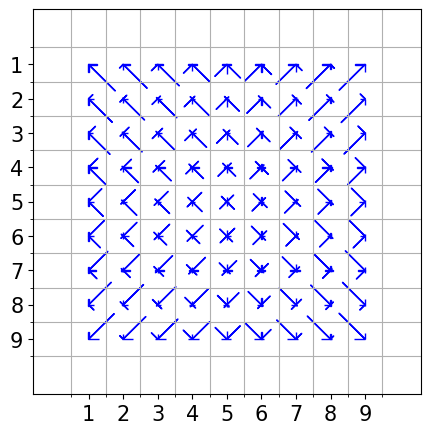

In [336]:
y_pred = SOM_labels ; nb_clusters = len(np.unique(y_pred))
transition_matrix = np.zeros((nb_clusters, nb_clusters))
for year in range(dataset_dict["first_year"], dataset_dict["last_year"]+1):
    if (year == dataset_dict["first_year"]): first_day_idx = 0 ; last_day_idx = 60
    elif (year % 4 == 0): first_day_idx = last_day_idx ; last_day_idx += 91 # Leap year
    else: first_day_idx = last_day_idx ; last_day_idx += 90 # Non-leap year

    for day in range(first_day_idx, last_day_idx-1, 1): # Don't include the last day as we are interested in the transition to the next day
        transition_matrix[int(y_pred[day]), int(y_pred[day+1])] += 1

transition_matrix = transition_matrix / np.sum(transition_matrix, axis=1, keepdims=True) * 100 # Normalise the transition matrix to get percentages

transition_in_each_direction = np.zeros((SOM_nrows, SOM_ncols, 8))
for node_from in range(SOM_nb_clusters):
    for node_to in range(SOM_nb_clusters):
        transition_value = transition_matrix[node_from, node_to]
        row_node = node_from // SOM_ncols ; col_node = node_from % SOM_ncols
        row = node_to // SOM_ncols ; col = node_to % SOM_ncols
        if (row == row_node and col == col_node): continue
        elif (row == row_node and col < col_node): transition_in_each_direction[row_node, col_node, 0] += transition_matrix[row, col] # Left
        elif (row == row_node and col > col_node): transition_in_each_direction[row_node, col_node, 1] += transition_matrix[row, col] # Right
        elif (row < row_node and col == col_node): transition_in_each_direction[row_node, col_node, 2] += transition_matrix[row, col] # Up
        elif (row > row_node and col == col_node): transition_in_each_direction[row_node, col_node, 3] += transition_matrix[row, col] # Down
        elif (row < row_node and col < col_node): transition_in_each_direction[row_node, col_node, 4] += transition_matrix[row, col] # Diagonal up-left
        elif (row < row_node and col > col_node): transition_in_each_direction[row_node, col_node, 5] += transition_matrix[row, col] # Diagonal up-right
        elif (row > row_node and col < col_node): transition_in_each_direction[row_node, col_node, 6] += transition_matrix[row, col] # Diagonal down-left
        elif (row > row_node and col > col_node): transition_in_each_direction[row_node, col_node, 7] += transition_matrix[row, col] # Diagonal down-right

transition_in_each_direction = transition_in_each_direction / np.sum(transition_in_each_direction, axis=2, keepdims=True) * 100 # Normalise the transition matrix to get percentages

# For the first node, draw an arrow in each direction with length proportional to the transition probability
plt.figure(figsize=(5, 5))
for i in range(SOM_nrows):
    for j in range(SOM_ncols):
        length = transition_in_each_direction[i, j, 0] / 50 ; plt.arrow(j, -i, -length, 0, width=0.01, head_width=0, head_length=0, fc='blue', ec='blue', length_includes_head=True) # Left
        length = transition_in_each_direction[i, j, 1] / 50 ; plt.arrow(j, -i, +length, 0, width=0.01, head_width=0, head_length=0, fc='blue', ec='blue', length_includes_head=True) # Right
        length = transition_in_each_direction[i, j, 2] / 50 ; plt.arrow(j, -i, 0, +length, width=0.01, head_width=0, head_length=0, fc='blue', ec='blue', length_includes_head=True) # Up
        length = transition_in_each_direction[i, j, 3] / 50 ; plt.arrow(j, -i, 0, -length, width=0.01, head_width=0, head_length=0, fc='blue', ec='blue', length_includes_head=True) # Down
        length = transition_in_each_direction[i, j, 4] / 50 ; plt.arrow(j, -i, -length/2, +length/2, width=0.01, head_width=0, head_length=0, fc='blue', ec='blue', length_includes_head=True) # Diagonal up-left
        length = transition_in_each_direction[i, j, 5] / 50 ; plt.arrow(j, -i, +length/2, +length/2, width=0.01, head_width=0, head_length=0, fc='blue', ec='blue', length_includes_head=True) # Diagonal up-right
        length = transition_in_each_direction[i, j, 6] / 50 ; plt.arrow(j, -i, -length/2, -length/2, width=0.01, head_width=0, head_length=0, fc='blue', ec='blue', length_includes_head=True) # Diagonal down-left
        length = transition_in_each_direction[i, j, 7] / 50 ; plt.arrow(j, -i, +length/2, -length/2, width=0.01, head_width=0, head_length=0, fc='blue', ec='blue', length_includes_head=True) # Diagonal down-right
plt.xticks(np.arange(-0.5, SOM_ncols, 1), minor=True) ; plt.yticks(np.arange(0.5, -SOM_ncols, -1), minor=True) ; plt.grid(which='minor', axis='both')
plt.xticks(ticks=np.arange(SOM_ncols), labels=np.arange(SOM_ncols)+1, fontsize=15) ; plt.yticks(ticks=np.arange(0, -SOM_nrows, -1), labels=np.arange(SOM_nrows)+1, fontsize=15)
plt.margins(x=0.2, y=0.2)
plt.show()

# plt.figure(figsize=(7, 7), constrained_layout=True)
# plt.title(f"Transition matrix SOM") ; sns_labels = np.arange(1, nb_clusters+1)
# sns.heatmap(transition_matrix, annot=False, fmt=".0f", cmap="Blues", cbar=True, vmin=0, vmax=np.max(transition_matrix), square=True, xticklabels=sns_labels, yticklabels=sns_labels) ; plt.show()

PCA algorithm with 9 modes performed in 0.22 seconds.
Total explained variance by the first 9 PCA modes: 75.67%
Transformed geopotential height shape: (7731, 9)
Principal components shape: (9, 1425)


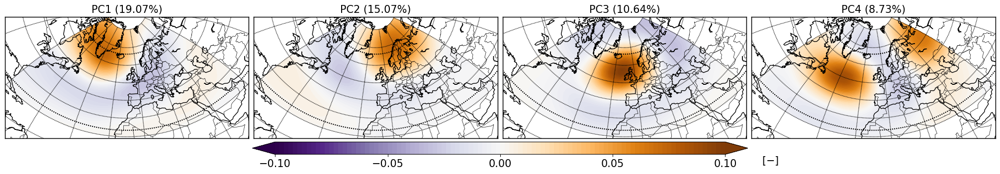

In [221]:
nb_modes = 9
data_for_PCA = geopotential_height_anomalies_reshaped

### Run PCA with nb_modes modes ###
start_time = time.time()
pca = PCA(n_components=nb_modes).fit(data_for_PCA)
end_time = time.time() ; print(f"PCA algorithm with {nb_modes} modes performed in {end_time-start_time:.2f} seconds.")

### Calculate the explained variance by the first nb_modes PCA modes ###
explained_variance = pca.explained_variance_ratio_ * 100
print(f"Total explained variance by the first {nb_modes} PCA modes: {explained_variance.sum():.2f}%")

### Transform the geopotential height anomalies using the PCA model (Project the data onto the first nb_modes PCA modes) ###
PCA_transformed_data = pca.transform(data_for_PCA)
print(f"Transformed geopotential height shape: {PCA_transformed_data.shape}")
print(f"Principal components shape: {pca.components_.shape}")

data_for_clustering = PCA_transformed_data


### Plot the first four principal components ###
nb_modes_to_plot = 4 ; ncols = 4 ; nrows = 1
fig, axs = plt.subplots(nrows=nb_modes_to_plot//4, ncols=nb_modes_to_plot, figsize=(ncols*5, nrows*3+0.5), constrained_layout=True) 
for mode in range(nb_modes_to_plot): # Loop over the cluster indices (starting from 0 --> +1)
    row = mode // ncols ; col = mode % ncols
    axs[col].set_title(f"PC{mode+1} ({explained_variance[mode]:.2f}%)", fontsize=15)
    m, contour, ticks = create_contour_data(ax=axs[col], dataset_dict=dataset_dict, type_plot="principal_component2",
                                            geopotential_height_data_to_plot=(pca.components_[mode, :].reshape(nb_lats, nb_longs)), lats=lats, longs=longs) # Reshape the 1-D array to a 2-D array

### Add a colorbar under the last row of subplots ###
cbar = fig.colorbar(contour, ax=axs, ticks=ticks, location='bottom', extend='both', shrink=0.5, pad=0.02, aspect=40)
cbar.ax.tick_params(axis="x", labelsize=15)
cbar.ax.text(x=1.1, y=-0.5, s=r'$[-]$', transform=cbar.ax.transAxes, ha='center', va='center', fontsize=15) # The coordinate system of the Axes: (0, 0) is bottom left, and (1, 1) is top right.
# plt.savefig(f"Images/PCA_{nb_modes}_PCs_{dataset_dict["first_year"]}-{dataset_dict["last_year"]}.png", dpi=300, bbox_inches='tight')
plt.show()

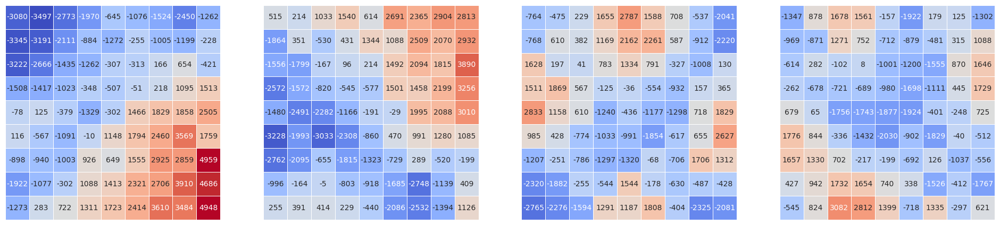

In [318]:
# Project the weights onto the first nb_modes PCA modes
PCA_transformed_weights = pca.transform(weights.reshape(SOM_nb_clusters, -1))

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(24, 6))
for mode in range(4):
    sns.heatmap(PCA_transformed_weights[:, mode].reshape(SOM_nrows, SOM_ncols), ax=axs[mode], annot=True, annot_kws={'size':10}, cmap='coolwarm', cbar=False, fmt=".0f", linewidth=0.5, square=True, vmin=np.min(PCA_transformed_weights), vmax=np.max(PCA_transformed_weights), xticklabels=False, yticklabels=False)
    axs[i].tick_params(labelsize=15)
plt.show()

# for mode in range(4):
#     plt.figure(figsize=(6, 6))
#     sns.heatmap(PCA_transformed_weights[:, mode].reshape(SOM_nrows, SOM_ncols), annot=True, annot_kws={'size':12}, cmap='coolwarm', cbar=False, fmt=".0f", linewidth=0.5,vmin=np.min(PCA_transformed_weights), vmax=np.max(PCA_transformed_weights), xticklabels=False, yticklabels=False)
#     ax = plt.gca() ; ax.tick_params(labelsize=15)
#     # plt.savefig(f"Images/SOM_{SOM_nrows}x{SOM_ncols}_PCA_scores_mode_{mode+1}.png", dpi=300, bbox_inches='tight')
#     plt.show()

---
## Link between the SOM nodes and the K-Means clusters ##
---

In [223]:
def plot_centroids(nb_clusters, cluster_centers, y_pred, method, cluster_names=None):
    ### Project the cluster centers back to the original space ###
    centroids_original_space = (cluster_centers @ pca.components_).reshape(nb_clusters, nb_lats, nb_longs)

    ### Sort the clusters in descending order of their frequency of occurrence ###
    frequency_array = np.array([np.sum(y_pred == cluster_idx) / len(y_pred) * 100 for cluster_idx in range(nb_clusters)]) ; sorted_indices = np.argsort(frequency_array)[::-1]

    ncols = 4 ; nrows = int(np.ceil(nb_clusters / ncols)) # ncols = 4
    fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*5, nrows*3+1), constrained_layout=True) # If save: nrows*3+0.5 - else: nrows*3+1

    for cluster_idx in range(nrows*ncols): # Loop over the cluster indices (starting from 0 --> +1)
        row = cluster_idx // ncols ; col = cluster_idx % ncols ; axis_to_plot = axs[col] if (nrows == 1) else axs[row, col]

        if (cluster_idx < nb_clusters):
            if cluster_names is not None: axis_to_plot.set_title(f"Cluster {cluster_idx+1}: {cluster_names[cluster_idx]} ({frequency_array[sorted_indices[cluster_idx]]:.1f}%)", fontsize=20)
            else: axis_to_plot.set_title(f"Cluster {cluster_idx+1} ({frequency_array[sorted_indices[cluster_idx]]:.2f}%)", fontsize=20)
            ### Create the contour plot ###
            m, contour, ticks = create_contour_data(ax=axis_to_plot, dataset_dict=dataset_dict, type_plot="geopotential_height_anomalies_temporal_mean",
                                                    geopotential_height_data_to_plot=(centroids_original_space[sorted_indices[cluster_idx], :]), weather_regime=False, lats=lats, longs=longs) # Reshape the 1-D array to a 2-D array
        else: axis_to_plot.set_visible(False)

    # fig.suptitle(f"Centroids {method} ({nb_clusters} clusters)", fontsize=20)
    cbar = fig.colorbar(contour, ax=axs, ticks=ticks, location='bottom', extend='both', shrink=0.75, pad=0.02, aspect=40)
    cbar.ax.tick_params(axis="x", labelsize=15, length=7.5, width=1)
    cbar.ax.text(x=1.1, y=-0.5, s=r'$[m]$', transform=cbar.ax.transAxes, ha='center', va='center', fontsize=15) # If save: y=-1.25 - else: y=-0.5
    # plt.savefig(f"Images/KMeans_{nb_clusters}_centroids_PCA_{dataset_dict['first_year']}_{dataset_dict['last_year']}.png", dpi=300, bbox_inches="tight")
    plt.show()

K-Means algorithm with 4 clusters performed in 14.61 seconds.


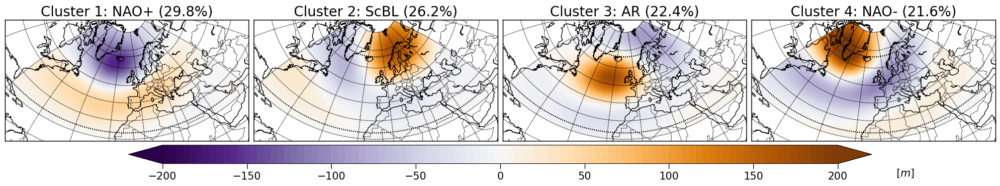

In [224]:
nb_clusters = 4 ; n_init = 1000
start_time = time.time()
kmeans_4 = KMeans(n_clusters=nb_clusters, init="k-means++", n_init=n_init).fit(data_for_clustering)
y_pred_kmeans_4 = kmeans_4.predict(data_for_clustering)
end_time = time.time()
print(f"K-Means algorithm with {nb_clusters} clusters performed in {end_time-start_time:.2f} seconds.")

### Sort the predicted labels based on the frequency of occurrence of each cluster ###
frequency_array_kmeans_4 = np.bincount(y_pred_kmeans_4) / len(y_pred_kmeans_4) * 100
sorted_indices_kmeans_4 = np.argsort(frequency_array_kmeans_4)[::-1]
y_pred_sorted_kmeans_4 = np.array([np.argwhere(sorted_indices_kmeans_4 == y_pred_kmeans_4[day])[0][0] for day in range(len(y_pred_kmeans_4))])

cluster_names_kmeans_4 = ["NAO+", "ScBL", "AR", "NAO-"]
plot_centroids(nb_clusters=len(cluster_names_kmeans_4), cluster_centers=kmeans_4.cluster_centers_, y_pred=y_pred_kmeans_4, method="K-Means", cluster_names=cluster_names_kmeans_4)

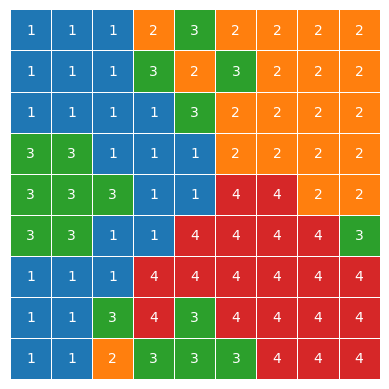

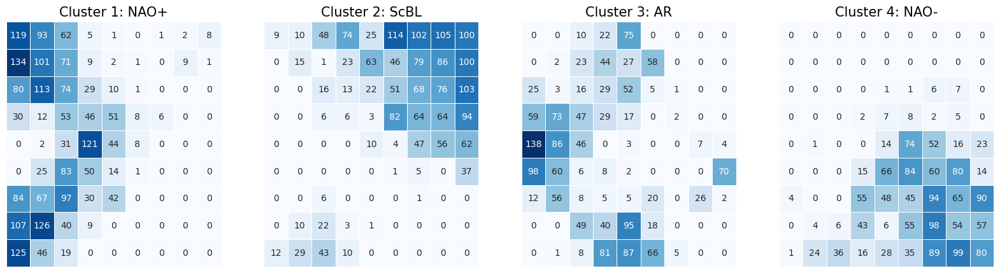

In [ ]:
nb_clusters = 4 ; overlap_SOM_kmeans_4 = np.zeros((SOM_nb_clusters, nb_clusters))
for day in range(len(y_pred_sorted_kmeans_4)):
    overlap_SOM_kmeans_4[SOM_labels[day], y_pred_sorted_kmeans_4[day]] += 1

overlap_SOM_kmeans_4_best_clusters = np.zeros(SOM_nb_clusters)
for node in range(SOM_nb_clusters):
    best_cluster = np.argmax(overlap_SOM_kmeans_4[node, :]) # Get the index of the cluster with the highest overlap
    overlap_SOM_kmeans_4_best_clusters[node] = best_cluster + 1 # Store the cluster index (starting from 1)
sns.heatmap(overlap_SOM_kmeans_4_best_clusters.reshape(SOM_nrows, SOM_ncols), annot=True, cmap=sns.color_palette("tab10", nb_clusters), cbar=False, fmt=".0f", linewidth=0.5, square=True, vmax=np.max(overlap_SOM_kmeans_4_best_clusters), xticklabels=False, yticklabels=False)
# plt.savefig(f"Images/SOM_KMeans_{nb_clusters}_best_clusters.png", dpi=300, bbox_inches='tight')
plt.show()

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
for i in range(nb_clusters):
    row, col = i // 4, i % 4 ; axis_to_plot = axs[col] ; axis_to_plot.set_title(f"Cluster {i+1}: {cluster_names_kmeans_4[i]}", fontsize=15)
    sns.heatmap(overlap_SOM_kmeans_4[:, i].reshape(SOM_nrows, SOM_ncols), ax=axis_to_plot, annot=True, cmap='Blues', cbar=False, fmt=".0f", linewidth=0.5, vmin=np.min(overlap_SOM_kmeans_4), vmax=np.max(overlap_SOM_kmeans_4), xticklabels=False, yticklabels=False)
plt.show()

# for i in range(nb_clusters):
#     fig, axis_to_plot = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))
#     sns.heatmap(overlap_SOM_kmeans_4[:, i].reshape(SOM_nrows, SOM_ncols), ax=axis_to_plot, annot=True, cmap='Blues', cbar=False, fmt=".0f", linewidth=0.5, vmin=np.min(overlap_SOM_kmeans_4), vmax=np.max(overlap_SOM_kmeans_4), xticklabels=False, yticklabels=False)
#     # Add a black border around the heatmap
#     for spine in axis_to_plot.spines.values():
#         spine.set_visible(True) ; spine.set_linewidth(1) ; spine.set_color('black')
#     # plt.savefig(f"Images/SOM_KMeans_{nb_clusters}_overlap_cluster_{i+1}.png", dpi=300, bbox_inches='tight')
#     plt.show()

K-Means algorithm with 7 clusters performed in 21.58 seconds.


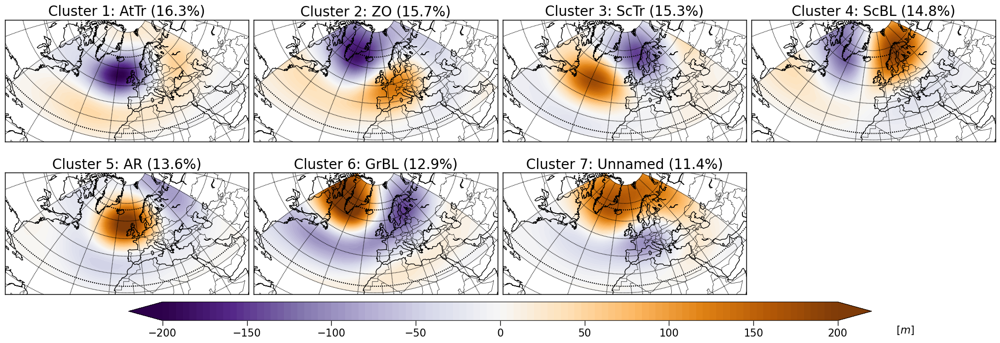

In [226]:
nb_clusters = 7 ; n_init = 1000
start_time = time.time()
kmeans_7 = KMeans(n_clusters=nb_clusters, init="k-means++", n_init=n_init).fit(data_for_clustering)
y_pred_kmeans_7 = kmeans_7.predict(data_for_clustering)
end_time = time.time()
print(f"K-Means algorithm with {nb_clusters} clusters performed in {end_time-start_time:.2f} seconds.")

### Sort the predicted labels based on the frequency of occurrence of each cluster ###
frequency_array_kmeans_7 = np.bincount(y_pred_kmeans_7) / len(y_pred_kmeans_7) * 100
sorted_indices_kmeans_7 = np.argsort(frequency_array_kmeans_7)[::-1]
y_pred_sorted_kmeans_7 = np.array([np.argwhere(sorted_indices_kmeans_7 == y_pred_kmeans_7[day])[0][0] for day in range(len(y_pred_kmeans_7))])

cluster_names_kmeans_7 = ["AtTr", "ZO", "ScTr", "ScBL", "AR", "GrBL", "Unnamed"]
plot_centroids(nb_clusters=len(cluster_names_kmeans_7), cluster_centers=kmeans_7.cluster_centers_, y_pred=y_pred_kmeans_7, method="K-Means", cluster_names=cluster_names_kmeans_7)

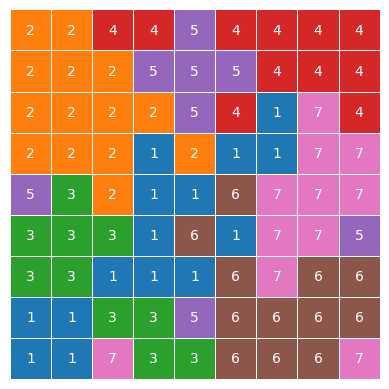

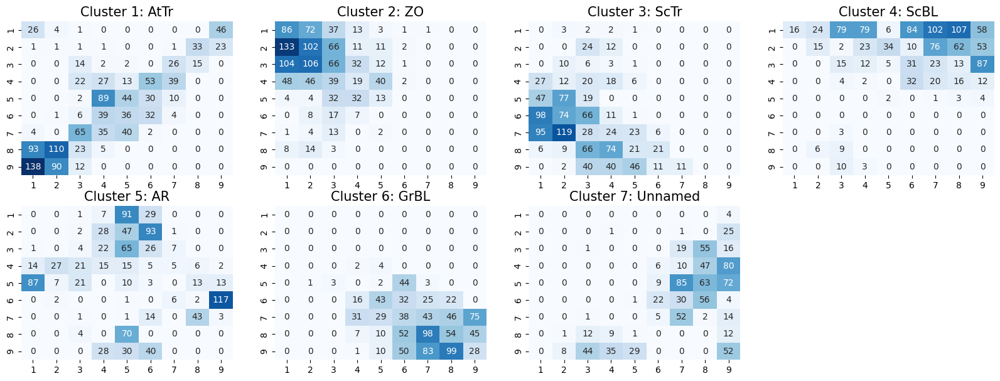

In [358]:
nb_clusters = 7 ; overlap_SOM_kmeans_7 = np.zeros((SOM_nb_clusters, nb_clusters))
for day in range(len(y_pred_sorted_kmeans_7)):
    overlap_SOM_kmeans_7[SOM_labels[day], y_pred_sorted_kmeans_7[day]] += 1

overlap_SOM_kmeans_7_best_clusters = np.zeros(SOM_nb_clusters)
for node in range(SOM_nb_clusters):
    best_cluster = np.argmax(overlap_SOM_kmeans_7[node, :]) # Get the index of the cluster with the highest overlap
    overlap_SOM_kmeans_7_best_clusters[node] = best_cluster + 1 # Store the cluster index (starting from 1)
sns.heatmap(overlap_SOM_kmeans_7_best_clusters.reshape(SOM_nrows, SOM_ncols), annot=True, cmap=sns.color_palette("tab10", nb_clusters), cbar=False, fmt=".0f", linewidth=0.5, square=True, xticklabels=False, yticklabels=False)
# plt.savefig(f"Images/SOM_KMeans_{nb_clusters}_best_clusters.png", dpi=300, bbox_inches='tight')
plt.show()

fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(20, 7))
for i in range(2*4):
    row = i // 4 ; col = i % 4 ; axis_to_plot = axs[row, col] ; axis_to_plot.set_title(f"Cluster {i+1}: {cluster_names_kmeans_7[i] if i < nb_clusters else ''}", fontsize=15)
    if (i < nb_clusters):
        sns.heatmap(overlap_SOM_kmeans_7[:, i].reshape(SOM_nrows, SOM_ncols), annot=True, cmap='Blues', cbar=False, fmt=".0f", vmin=0, vmax=np.max(overlap_SOM_kmeans_7), xticklabels=np.arange(SOM_ncols)+1, yticklabels=np.arange(SOM_nrows)+1, ax=axis_to_plot)
    else: axis_to_plot.set_visible(False)
plt.show()

# for i in range(nb_clusters):
#     fig, axis_to_plot = plt.subplots(nrows=1, ncols=1, figsize=(5, 5))
#     sns.heatmap(overlap_SOM_kmeans_7[:, i].reshape(SOM_nrows, SOM_ncols), ax=axis_to_plot, annot=True, cmap='Blues', cbar=False, fmt=".0f", linewidth=0.5, vmin=np.min(overlap_SOM_kmeans_7), vmax=np.max(overlap_SOM_kmeans_7), xticklabels=False, yticklabels=False)
#     # Add a black border around the heatmap
#     for spine in axis_to_plot.spines.values():
#         spine.set_visible(True) ; spine.set_linewidth(1) ; spine.set_color('black')
#     # plt.savefig(f"Images/SOM_KMeans_{nb_clusters}_overlap_cluster_{i+1}.png", dpi=300, bbox_inches='tight')
#     plt.show()

K-Means algorithm with 8 clusters performed in 25.39 seconds.


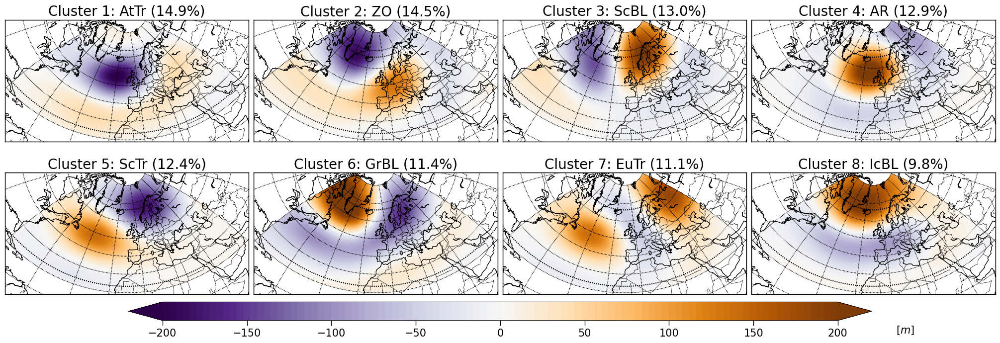

In [228]:
nb_clusters = 8 ; n_init = 1000
start_time = time.time()
kmeans_8 = KMeans(n_clusters=nb_clusters, init="k-means++", n_init=n_init).fit(data_for_clustering)
y_pred_kmeans_8 = kmeans_8.predict(data_for_clustering)
end_time = time.time()
print(f"K-Means algorithm with {nb_clusters} clusters performed in {end_time-start_time:.2f} seconds.")

### Sort the predicted labels based on the frequency of occurrence of each cluster ###
frequency_array_kmeans_8 = np.bincount(y_pred_kmeans_8) / len(y_pred_kmeans_8) * 100
sorted_indices_kmeans_8 = np.argsort(frequency_array_kmeans_8)[::-1]
y_pred_sorted_kmeans_8 = np.array([np.argwhere(sorted_indices_kmeans_8 == y_pred_kmeans_8[day])[0][0] for day in range(len(y_pred_kmeans_8))])

cluster_names_kmeans_8 = ["AtTr", "ZO", "ScBL", "AR", "ScTr", "GrBL", "EuTr", "IcBL"]
plot_centroids(nb_clusters=len(cluster_names_kmeans_8), cluster_centers=kmeans_8.cluster_centers_, y_pred=y_pred_kmeans_8, method="K-Means", cluster_names=cluster_names_kmeans_8)

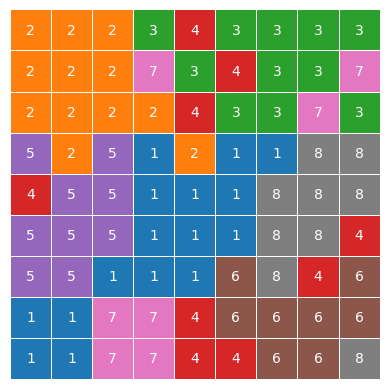

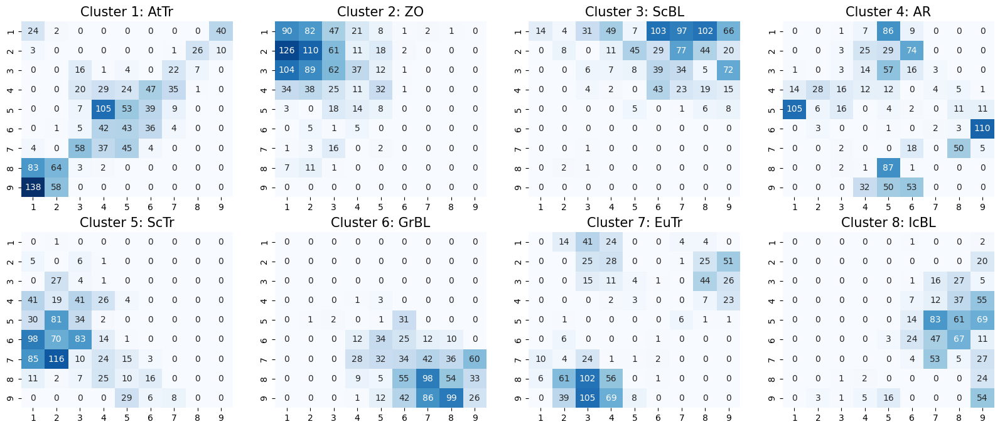

In [360]:
nb_clusters = 8 ; overlap_SOM_kmeans_8 = np.zeros((SOM_nb_clusters, nb_clusters))
for day in range(len(y_pred_sorted_kmeans_8)):
    overlap_SOM_kmeans_8[SOM_labels[day], y_pred_sorted_kmeans_8[day]] += 1

overlap_SOM_kmeans_8_best_clusters = np.zeros(SOM_nb_clusters)
for node in range(SOM_nb_clusters):
    best_cluster = np.argmax(overlap_SOM_kmeans_8[node, :]) # Get the index of the cluster with the highest overlap
    overlap_SOM_kmeans_8_best_clusters[node] = best_cluster + 1 # Store the cluster index (starting from 1)
sns.heatmap(overlap_SOM_kmeans_8_best_clusters.reshape(SOM_nrows, SOM_ncols), annot=True, cmap=sns.color_palette("tab10", nb_clusters), cbar=False, fmt=".0f", linewidth=0.5, square=True, xticklabels=False, yticklabels=False)
# plt.savefig(f"Images/SOM_KMeans_{nb_clusters}_best_clusters.png", dpi=300, bbox_inches='tight')
plt.show()

fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(20, 8))
for i in range(2*4):
    row = i // 4 ; col = i % 4 ; axis_to_plot = axs[row, col] ; axis_to_plot.set_title(f"Cluster {i+1}: {cluster_names_kmeans_8[i] if i < len(cluster_names_kmeans_8) else ''}", fontsize=15)
    if (i < nb_clusters):
        sns.heatmap(overlap_SOM_kmeans_8[:, i].reshape(SOM_nrows, SOM_ncols), annot=True, cmap='Blues', cbar=False, fmt=".0f", vmin=0, vmax=np.max(overlap_SOM_kmeans_8), xticklabels=np.arange(SOM_ncols)+1, yticklabels=np.arange(SOM_nrows)+1, ax=axis_to_plot)
    else: axis_to_plot.set_visible(False)
plt.show()

GMM algorithm with 4 clusters performed in 11.76 seconds.


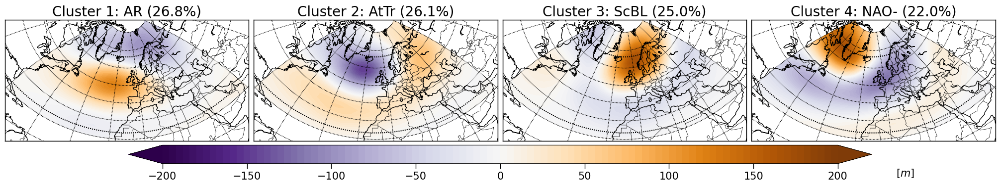

In [235]:
### GMM clustering with 4 clusters ###
nb_clusters = 4 ; n_init = 100
start_time = time.time()
gmm_4 = GaussianMixture(n_components=nb_clusters, n_init=n_init, covariance_type='full').fit(data_for_clustering)
y_pred_gmm_4 = gmm_4.predict(data_for_clustering)
end_time = time.time()
print(f"GMM algorithm with {nb_clusters} clusters performed in {end_time-start_time:.2f} seconds.")

### Sort the predicted labels based on the frequency of occurrence of each cluster ###
frequency_array_gmm_4 = np.bincount(y_pred_gmm_4) / len(y_pred_gmm_4) * 100
sorted_indices_gmm_4 = np.argsort(frequency_array_gmm_4)[::-1]
y_pred_sorted_gmm_4 = np.array([np.argwhere(sorted_indices_gmm_4 == y_pred_gmm_4[day])[0][0] for day in range(len(y_pred_gmm_4))])

cluster_names_gmm_4 = ["AR", "AtTr", "ScBL", "NAO-"]
plot_centroids(nb_clusters=len(cluster_names_gmm_4), cluster_centers=gmm_4.means_, y_pred=y_pred_gmm_4, method="GMM", cluster_names=cluster_names_gmm_4)

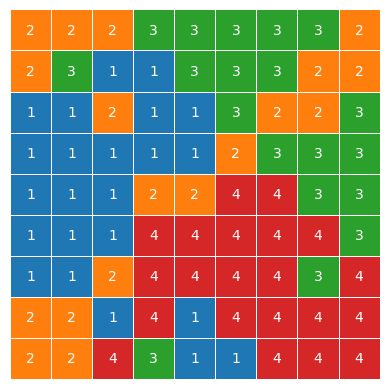

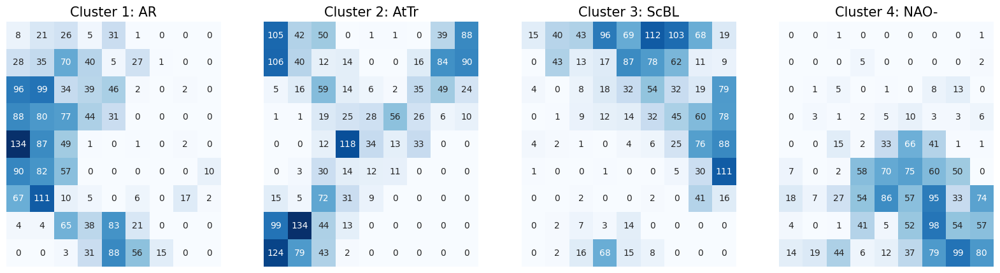

In [ ]:
nb_clusters = 4 ; overlap_SOM_gmm_4 = np.zeros((SOM_nb_clusters, nb_clusters))
for day in range(len(y_pred_sorted_gmm_4)):
    overlap_SOM_gmm_4[SOM_labels[day], y_pred_sorted_gmm_4[day]] += 1

overlap_SOM_gmm_4_best_clusters = np.zeros(SOM_nb_clusters)
for node in range(SOM_nb_clusters):
    best_cluster = np.argmax(overlap_SOM_gmm_4[node, :]) # Get the index of the cluster with the highest overlap
    overlap_SOM_gmm_4_best_clusters[node] = best_cluster + 1 # Store the cluster index (starting from 1)
sns.heatmap(overlap_SOM_gmm_4_best_clusters.reshape(SOM_nrows, SOM_ncols), annot=True, cmap=sns.color_palette("tab10", nb_clusters), cbar=False, fmt=".0f", linewidth=0.5, square=True, xticklabels=False, yticklabels=False)
# plt.savefig(f"Images/SOM_GMM_{nb_clusters}_best_clusters.png", dpi=300, bbox_inches='tight')
plt.show()

fig, axs = plt.subplots(nrows=1, ncols=4, figsize=(20, 5))
for i in range(4):
    row = i // 4 ; col = i % 4 ; axis_to_plot = axs[col] ; axis_to_plot.set_title(f"Cluster {i+1}: {cluster_names_gmm_4[i]}", fontsize=15)
    sns.heatmap(overlap_SOM_gmm_4[:, i].reshape(SOM_nrows, SOM_ncols), annot=True, cmap='Blues', cbar=False, fmt=".0f", vmin=0, vmax=np.max(overlap_SOM_gmm_4), xticklabels=False, yticklabels=False, ax=axis_to_plot)
plt.show()

GMM algorithm with 7 clusters performed in 23.27 seconds.


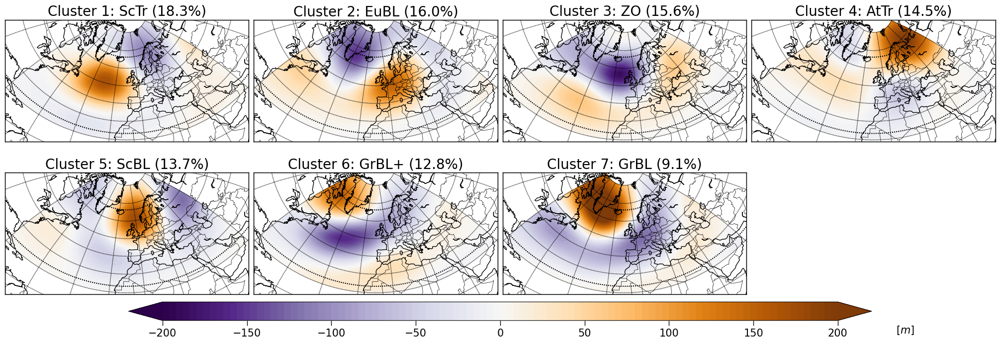

In [251]:
### GMM clustering with 7 clusters ###
nb_clusters = 7 ; n_init = 100
start_time = time.time()
gmm_7 = GaussianMixture(n_components=nb_clusters, n_init=n_init, covariance_type='full').fit(data_for_clustering)
y_pred_gmm_7 = gmm_7.predict(data_for_clustering)
end_time = time.time()
print(f"GMM algorithm with {nb_clusters} clusters performed in {end_time-start_time:.2f} seconds.")

### Sort the predicted labels based on the frequency of occurrence of each cluster ###
frequency_array_gmm_7 = np.bincount(y_pred_gmm_7) / len(y_pred_gmm_7) * 100
sorted_indices_gmm_7 = np.argsort(frequency_array_gmm_7)[::-1]
y_pred_sorted_gmm_7 = np.array([np.argwhere(sorted_indices_gmm_7 == y_pred_gmm_7[day])[0][0] for day in range(len(y_pred_gmm_7))])

cluster_names_gmm_7 = ["ScTr", "EuBL", "ZO", "AtTr", "ScBL", "GrBL+", "GrBL"]
plot_centroids(nb_clusters=len(cluster_names_gmm_7), cluster_centers=gmm_7.means_, y_pred=y_pred_gmm_7, method="GMM", cluster_names=cluster_names_gmm_7)

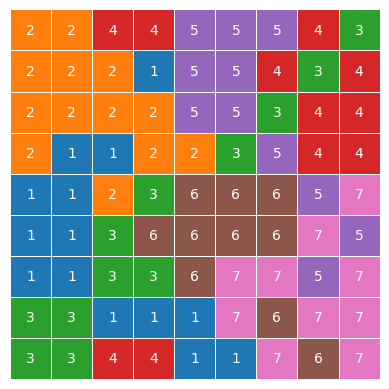

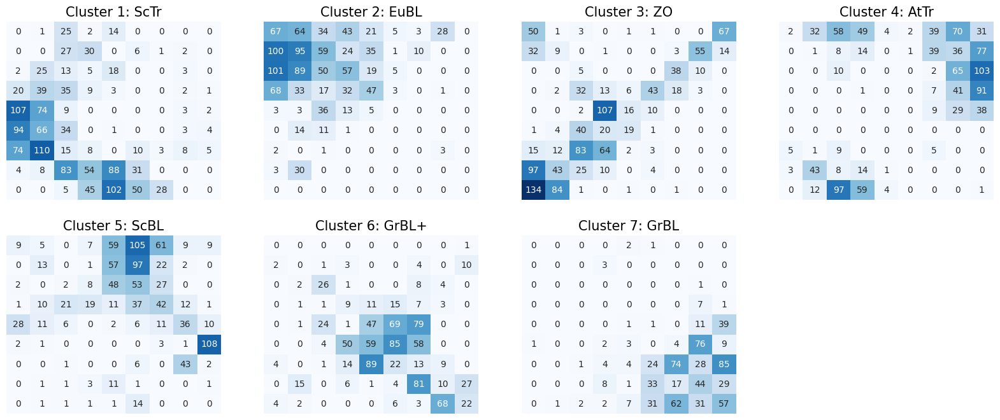

In [365]:
nb_clusters = 7 ; overlap_SOM_gmm_7 = np.zeros((SOM_nb_clusters, nb_clusters))
for day in range(len(y_pred_sorted_gmm_7)):
    overlap_SOM_gmm_7[SOM_labels[day], y_pred_sorted_gmm_7[day]] += 1

overlap_SOM_gmm_7_best_clusters = np.zeros(SOM_nb_clusters)
for node in range(SOM_nb_clusters):
    best_cluster = np.argmax(overlap_SOM_gmm_7[node, :]) # Get the index of the cluster with the highest overlap
    overlap_SOM_gmm_7_best_clusters[node] = best_cluster + 1 # Store the cluster index (starting from 1)
sns.heatmap(overlap_SOM_gmm_7_best_clusters.reshape(SOM_nrows, SOM_ncols), annot=True, cmap=sns.color_palette("tab10", nb_clusters), cbar=False, fmt=".0f", linewidth=0.5, square=True, xticklabels=False, yticklabels=False)
# plt.savefig(f"Images/SOM_GMM_{nb_clusters}_best_clusters.png", dpi=300, bbox_inches='tight')
plt.show()

fig, axs = plt.subplots(nrows=2, ncols=4, figsize=(20, 8))
for i in range(2*4):
    row = i // 4 ; col = i % 4 ; axis_to_plot = axs[row, col] ; axis_to_plot.set_title(f"Cluster {i+1}: {cluster_names_gmm_7[i] if i < nb_clusters else ''}", fontsize=15)
    if (i < nb_clusters):
        sns.heatmap(overlap_SOM_gmm_7[:, i].reshape(SOM_nrows, SOM_ncols), annot=True, cmap='Blues', cbar=False, fmt=".0f", vmin=0, vmax=np.max(overlap_SOM_gmm_7), xticklabels=False, yticklabels=False, ax=axis_to_plot)
    else: axis_to_plot.set_visible(False)
plt.show()